In [63]:
import copy
import cv2
import numpy as np
import open3d as o3d
from PIL import Image
from sgbm_multi_scan import visualize_disparity
from sgbm_multi_scan import downsample_and_denoise, keep_largest_cluster, to_o3d, plot_points_plotly, register_pair, multiway_register
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [52]:
def plot_clouds(pcd_list, color_list, title="Point Clouds", flip_z = False):
    """
    Display any number of point clouds in Plotly.
    pcd_list:  [pcd1, pcd2, pcd3, ...]
    color_list: [[r,g,b], [r,g,b], ...]  (floats 0..1)
    """
    all_pts = []
    all_cols = []

    for pcd, color in zip(pcd_list, color_list):
        pts = np.asarray(pcd.points)
        if flip_z:
            pts = pts.copy()
            pts[:, 2] *= -1

        cols = np.tile(np.array([color]), (len(pts), 1))

        all_pts.append(pts)
        all_cols.append(cols)

    pts = np.vstack(all_pts)
    cols = np.vstack(all_cols)

    plot_points_plotly(pts, colors_rgb=cols, title=title)

In [53]:
def process_stereo_pair(number):
    base            = "/home/jonathan/Github/FSR_DLNR/face_laser_projector/no_markers-09_11/"
    clahe           = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    new_h           = 720
    block_size      = 5
    block_factor    = 1
    min_disp        = -250
    max_disp        = -50
    voxel           = 0.5
    nb_neighbors    = 60
    std_ratio       = 1.2
    eps_factor      = 2.5
    min_cluster_pts = 25

    # Stereo matcher + Q matrix (hard coded)
    stereo = cv2.StereoSGBM.create(
        minDisparity      = min_disp,
        numDisparities    = max_disp - min_disp,
        blockSize         = block_size,
        P1                = int(8 * block_factor * block_size**2),
        P2                = int(32 * block_factor * block_size**2),
        disp12MaxDiff     = 0,
        uniquenessRatio   = 8,
        speckleWindowSize = 500,
        speckleRange      = 2,
        mode              = 3,
)

    q = np.load("face_laser_projector/disp_to_depth_mat.npy")

    # --- Load images ---
    imgL = cv2.imread(base + number + "_left.jpg",  cv2.IMREAD_GRAYSCALE)
    imgR = cv2.imread(base + number + "_right.jpg", cv2.IMREAD_GRAYSCALE)

    # --- Resize ---
    h, w = imgL.shape
    scale = new_h / h
    new_w, new_h = int(w * scale), int(h * scale)
    imgL = cv2.resize(imgL, (new_w, new_h), interpolation=cv2.INTER_AREA)
    imgR = cv2.resize(imgR, (new_w, new_h), interpolation=cv2.INTER_AREA)

    # --- CLAHE ---
    imgL = clahe.apply(imgL)
    imgR = clahe.apply(imgR)

    # --- Disparity ---
    disparity = stereo.compute(imgL, imgR).astype(np.float32) / 16.0
    valid = disparity > min_disp

    # --- 3D reconstruction ---
    points_3d = cv2.reprojectImageTo3D(disparity, q, handleMissingValues=True)

    # --- Raw PCD ---
    pcd_raw = to_o3d(points_3d[valid])

    # --- Cleaning ---
    pcd_clean = downsample_and_denoise(
        pcd_raw,
        voxel        = voxel,
        nb_neighbors = nb_neighbors,
        std_ratio    = std_ratio
    )

    # --- Largest cluster ---
    pcd_filtered = keep_largest_cluster(
        pcd_clean,
        eps        = voxel * eps_factor,
        min_points = min_cluster_pts
    )

    return pcd_filtered, pcd_raw, imgL, imgR, disparity, valid 


In [54]:
pcd_filtered1, pcd_raw1, imgL1, imgR1, disparity1, valid1 =  process_stereo_pair('00000')

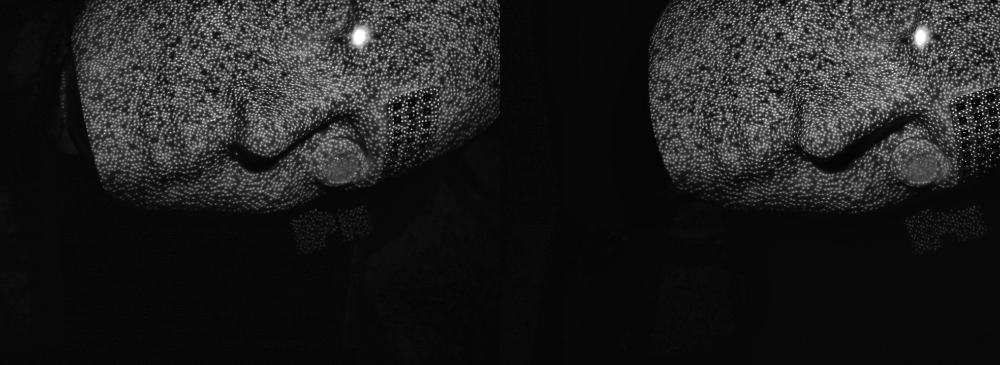

In [55]:
h,w = imgL1.shape
combined = Image.new('L', (2 * w, h)) 
combined.paste(Image.fromarray(imgL1), (0, 0))
combined.paste(Image.fromarray(imgR1), (w, 0))
display(combined)

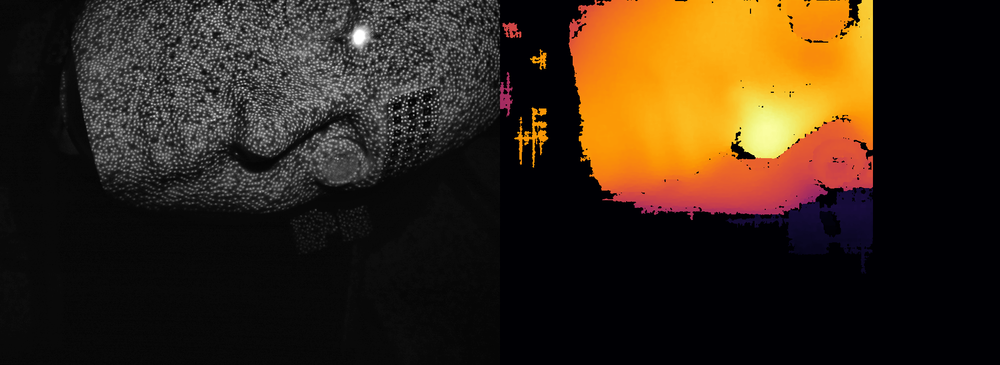

In [56]:
disparity1_valid = disparity1.copy()

# filter and display
disparity1_valid[~valid1] = np.nan  

# norm
min_valid = np.nanmin(disparity1_valid)
max_valid = np.nanmax(disparity1_valid)
disp_norm = (disparity1_valid - min_valid) / (max_valid - min_valid)

# Replace NaNs (invalid areas) with 0
disp_norm = np.nan_to_num(disp_norm, nan=0.0)

# Convert to uint8 for visualization
disp_uint8 = (disp_norm * 255).astype(np.uint8)

combined_viz, _ = visualize_disparity(disp_uint8, imgL1, show=False)
display(combined_viz)

In [57]:
plot_clouds([pcd_raw1, pcd_filtered1], [[1, 0, 0], [0, 0, 1]], title="Filtered Clouds: pcd1_clean (red) vs pcd1_filtered (blue)")

Load 2nd scan for registration:

In [58]:
pcd_filtered2, pcd_raw2, imgL2, imgR2, disparity2, valid2 =  process_stereo_pair('00010')
plot_clouds([pcd_filtered1, pcd_filtered2], [[0, 0, 1], [0, 1, 0]], title="pcd1 (blue) vs pcd2 (green)")

Test matching:

In [59]:
pair_transform = register_pair(pcd_filtered2, pcd_filtered1, voxel = 0.5)
pcd_aligned2 = copy.deepcopy(pcd_filtered2)
pcd_aligned2.transform(pair_transform)
plot_clouds([pcd_filtered1, pcd_aligned2], [[0, 0, 1], [0, 1, 0]], title="pcd1 (blue) vs pcd2 (green)")

Load more point clouds and preform multi-way registration:

In [60]:
pcd_filtered3, _, _, _, _, _ =  process_stereo_pair('00020')
pcd_filtered4, _, _, _, _, _ =  process_stereo_pair('00030')
pcd_filtered5, _, _, _, _, _ =  process_stereo_pair('00040')
pcd_filtered6, _, _, _, _, _ =  process_stereo_pair('00050')
pcd_filtered7, _, _, _, _, _ =  process_stereo_pair('00060')

In [61]:
plot_clouds([pcd_filtered7], [[0,0,1]])

In [ ]:
pcd_filtered_list = [pcd_filtered1, pcd_filtered2, pcd_filtered3, pcd_filtered4, pcd_filtered5, pcd_filtered6, pcd_filtered7]
Tij = multiway_register(pcd_filtered_list, voxel=0.5, verbose=False)

# display
pcd_aligned_list = []
for pcd, T in zip(pcd_filtered_list, Tij):
    p = copy.deepcopy(pcd)
    p.transform(T)
    pcd_aligned_list.append(p)

colors = np.random.rand(len(pcd_aligned_list), 3).tolist()
plot_clouds(
    pcd_aligned_list,
    colors,
    title="All Aligned Clouds",
    flip_z=True
)

In [68]:
pcd_merged = pcd_aligned_list[0]
for p in pcd_aligned_list[1:]:
    pcd_merged += p

pcd_final= downsample_and_denoise(pcd_merged, voxel=0.5, nb_neighbors=20, std_ratio=1.2)
# pcd_final = pcd_merged.voxel_down_sample(voxel_size=0.5)

plot_clouds(
    [pcd_final],
    [[0,0,1]],
    title="Final",
    flip_z=True
)